In [1]:
import pandas as pd
import seaborn as sns
import folium, requests, io
from scipy import stats

from zipfile import ZipFile

In [7]:
zip_file_url= 'https://vicroadsopendatastorehouse.vicroads.vic.gov.au/opendata/Road_Safety/ACCIDENT.zip'
r = requests.get(zip_file_url)
files = ZipFile(io.BytesIO(r.content))

df = pd.read_csv(files.open("ACCIDENT.csv"))
df['ACCIDENTTIME'] = ' ' + df['ACCIDENTTIME'].str.strip()

df['DATE'] = pd.to_datetime(df['ACCIDENTDATE'] + df['ACCIDENTTIME'])
df['ACCIDENTYEAR'] = df['DATE'].dt.year
df['ACCIDENTHOUR'] = df['DATE'].dt.hour

foo = pd.read_csv(files.open('NODE.csv'), usecols = ['ACCIDENT_NO', 'LGA_NAME', 'Lat', 'Long']).drop_duplicates(subset=['ACCIDENT_NO'])
df = df.merge(foo, left_on='ACCIDENT_NO',right_on='ACCIDENT_NO', how='inner')

foo = pd.read_csv(files.open('ROAD_SURFACE_COND.csv'), usecols=['ACCIDENT_NO', 'SURFACE_COND', 'Surface Cond Desc']).drop_duplicates(subset=['ACCIDENT_NO'])
df = df.merge(foo, left_on='ACCIDENT_NO',right_on='ACCIDENT_NO', how='left')

foo = pd.read_csv(files.open('ACCIDENT_LOCATION.csv'), usecols=['ACCIDENT_NO', 'ROAD_NAME'])
df = df.merge(foo, left_on='ACCIDENT_NO',right_on='ACCIDENT_NO', how='left')

foo = pd.read_csv(files.open('VEHICLE.csv'), usecols=['ACCIDENT_NO', 'VEHICLE_YEAR_MANUF'])
foo = foo[foo['VEHICLE_YEAR_MANUF'] > 1900]
# We keep the oldest car involved in the accident
foo = foo.groupby('ACCIDENT_NO').min().reset_index()
df = df.merge(foo[['ACCIDENT_NO', 'VEHICLE_YEAR_MANUF']], left_on='ACCIDENT_NO',right_on='ACCIDENT_NO', how='left')

foo = pd.read_csv(files.open('SUBDCA.csv'), usecols=['ACCIDENT_NO', 'Sub Dca Code Desc'])
foo = foo.groupby('ACCIDENT_NO').agg(','.join).reset_index()
df = df.merge(foo[['ACCIDENT_NO', 'Sub Dca Code Desc']], left_on='ACCIDENT_NO',right_on='ACCIDENT_NO', how='left')

print(df.shape)


C:\Users\mifta\AppData\Local\Temp\ipykernel_8768\530729052.py:5: DtypeWarning: Columns (10,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(files.open("ACCIDENT.csv"))


(202854, 39)


In [8]:
# Dummy variable
df['accident'] = 1

### Distribution of time between two severe accidents

What is the probability distribution of time between two fatal accidents ?

count    3706.000000
mean       35.335942
std        38.282033
min         0.000000
25%         9.333333
50%        23.766667
75%        48.429167
max       521.333333
Name: DATE, dtype: float64


<AxesSubplot:xlabel='DATE', ylabel='Density'>

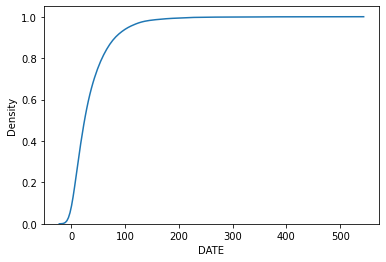

In [9]:
srt = df.sort_values('DATE')
ts = srt[srt.SEVERITY <= 1]['DATE']
dt_hours = (ts.shift(-1) - ts).dt.total_seconds()/3600
print(dt_hours.describe())
sns.kdeplot(dt_hours, cumulative=True, common_norm=False, common_grid=True)

### Histograms

In [10]:
import plotly.express as px
fig = px.histogram(df.sort_values('SEVERITY'), x="ACCIDENTYEAR", y="accident",
             color='SEVERITY', barmode='stack',
             height=400)
fig.show()

In [21]:
fig = px.histogram(df, x="ACCIDENTHOUR", y="accident",
             color='SEVERITY', barmode='stack',
             category_orders={'SEVERITY':list(range(5))})
fig.show()

### Vehicle age

How does vehicle age evolved over the 15 years observed, and do they explain a drop in severity ?

In [13]:
# make the pivot table
a = pd.pivot_table(df[['ACCIDENTYEAR', 'VEHICLE_YEAR_MANUF', 'accident']],
    index='ACCIDENTYEAR',columns='VEHICLE_YEAR_MANUF', values='accident',
    aggfunc=sum
).fillna(0)
a.tail()

VEHICLE_YEAR_MANUF,1904.0,1905.0,1909.0,1910.0,1911.0,1913.0,1918.0,1922.0,1923.0,1925.0,...,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0,2020.0
ACCIDENTYEAR,,,,,,,,,,,,,,,,,,,,,
2016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,592.0,583.0,523.0,488.0,433.0,158.0,0.0,0.0,0.0,0.0
2017,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,512.0,488.0,459.0,455.0,409.0,382.0,128.0,0.0,0.0,0.0
2018,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,492.0,535.0,473.0,422.0,457.0,377.0,359.0,121.0,0.0,0.0
2019,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,594.0,622.0,550.0,541.0,521.0,439.0,390.0,378.0,142.0,0.0
2020,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,238.0,241.0,279.0,223.0,249.0,220.0,193.0,186.0,162.0,20.0


Visualise distribution of vehicle make of vehicle involved in accidents over the years

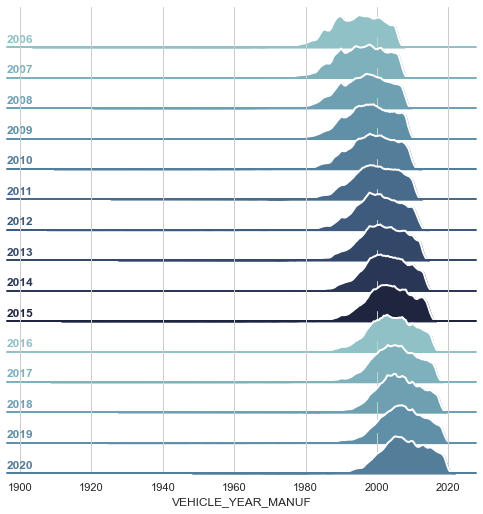

In [14]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_theme(style="whitegrid", rc={"axes.facecolor": (0, 0, 0, 0)})

# Create the data
tab = df[['ACCIDENTYEAR', 'VEHICLE_YEAR_MANUF']]

# Initialize the FacetGrid object
pal = sns.cubehelix_palette(10, rot=-.25, light=.7)
g = sns.FacetGrid(tab, row='ACCIDENTYEAR', hue='ACCIDENTYEAR', aspect=15, height=.5, palette=pal)

# Draw the densities in a few steps
g.map(sns.kdeplot, 'VEHICLE_YEAR_MANUF',
      bw_adjust=.5, clip_on=False,
      fill=True, alpha=1, linewidth=1.5)
g.map(sns.kdeplot, 'VEHICLE_YEAR_MANUF', clip_on=False, color="w", lw=2, bw_adjust=.5)

# passing color=None to refline() uses the hue mapping
g.refline(y=0, linewidth=2, linestyle="-", color=None, clip_on=False)


# Define and use a simple function to label the plot in axes coordinates
def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, fontweight="bold", color=color,
            ha="left", va="center", transform=ax.transAxes)


g.map(label, 'VEHICLE_YEAR_MANUF')

# Set the subplots to overlap
g.figure.subplots_adjust(hspace=-.25)

# Remove axes details that don't play well with overlap
g.set_titles("")
g.set(yticks=[], ylabel="")
g.despine(bottom=True, left=True)

Does the data validate a statistical relationship between vehicle make and severity

In [15]:
import statsmodels.api as sm
tab = df[['SEVERITY', 'VEHICLE_YEAR_MANUF']].dropna()
y,X = tab['SEVERITY'], tab['VEHICLE_YEAR_MANUF']
mod = sm.OLS(y, X)
res = mod.fit()
print(res.summary())

                                 OLS Regression Results                                
Dep. Variable:               SEVERITY   R-squared (uncentered):                   0.962
Model:                            OLS   Adj. R-squared (uncentered):              0.962
Method:                 Least Squares   F-statistic:                          4.931e+06
Date:                Wed, 16 Feb 2022   Prob (F-statistic):                        0.00
Time:                        21:09:56   Log-Likelihood:                     -1.4744e+05
No. Observations:              192890   AIC:                                  2.949e+05
Df Residuals:                  192889   BIC:                                  2.949e+05
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                         coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------

Positive correlation with a $p_{value} <0.05$

### Accident Type

In [35]:
a = df[['Accident Type Desc', 'ACCIDENTYEAR', 'accident']].groupby(['Accident Type Desc', 'ACCIDENTYEAR']).sum().sort_values('accident', ascending=False)
a = pd.pivot_table(a.reset_index(), index='Accident Type Desc', columns='ACCIDENTYEAR', values='accident').fillna(0)
a

ACCIDENTYEAR,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
Accident Type Desc,,,,,,,,,,,,,,,
Collision with a fixed object,2519,2476,2445,2389,2252,2308,2162,2196,2300,2422,2519,2147,2040,2019,991
Collision with vehicle,8067,8193,8276,8182,8248,8640,8664,8676,9042,10087,10079,8642,8315,9491,3818
Fall from or in moving vehicle,108,144,157,138,197,152,158,110,77,72,74,63,68,164,25
No collision and no object struck,635,728,726,682,621,750,748,757,847,825,718,525,407,374,232
Other accident,4,8,9,9,7,8,5,10,12,8,16,4,11,11,11
Struck Pedestrian,1318,1407,1464,1417,1474,1439,1319,1267,1197,1232,1319,1164,1154,1229,438
Struck animal,113,108,98,113,108,96,129,144,144,178,192,93,130,144,68
Vehicle overturned (no collision),676,546,635,622,520,516,581,706,741,791,755,645,542,565,371
collision with some other object,141,120,117,131,136,124,116,137,115,133,179,109,122,163,83


### Heatmap

Some roads and intersections appear clearly as hotspots for accidents

In [24]:
#Import the Lib
import folium
from folium.plugins import HeatMap

top_roads = df.groupby('ROAD_NAME').size().sort_values(ascending=False).head(50)
#Make the list of Lat an Lng
filtered = df[(df.ROAD_NAME.isin(top_roads.index)) & (df.SEVERITY == 1)]

#Create the Map
map = folium.Map(
    location=[df.Lat.mean(), df.Long.mean()],
    tiles='cartodbdark_matter',
    zoom_start=11
)
HeatMap(list(zip(filtered.Lat, filtered.Long)), radius=6, blur=5).add_to(map)
map

### Description of Severe accidents

Most prevalent accident types

In [18]:
severe = df[df.SEVERITY <= 2]
tfoo = severe[severe['Light Condition Desc'].str.contains('Dark')][['ACCIDENTYEAR', 'DCA Description','accident']]
types = pd.pivot_table(tfoo, values='accident', columns='ACCIDENTYEAR', index='DCA Description', aggfunc=sum)
types['total'] = types.sum(axis=1)

# Select the 10 prevalent accident types
top = types.sort_values('total', ascending=False).head(10).fillna(0)
top

ACCIDENTYEAR,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,total
DCA Description,,,,,,,,,,,,,,,,
LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICLE,236.0,267.0,248.0,229.0,208.0,223.0,169.0,160.0,163.0,155.0,149.0,123.0,133.0,97.0,73.0,2633.0
RIGHT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICLE,206.0,230.0,219.0,205.0,159.0,175.0,148.0,124.0,117.0,107.0,120.0,101.0,88.0,70.0,62.0,2131.0
RIGHT THROUGH,125.0,152.0,146.0,130.0,113.0,113.0,110.0,123.0,89.0,95.0,125.0,110.0,81.0,83.0,34.0,1629.0
REAR END(VEHICLES IN SAME LANE),91.0,104.0,101.0,85.0,106.0,108.0,87.0,106.0,93.0,86.0,110.0,86.0,84.0,87.0,27.0,1361.0
PED NEAR SIDE. PED HIT BY VEHICLE FROM THE RIGHT.,61.0,83.0,96.0,67.0,71.0,66.0,64.0,65.0,43.0,58.0,87.0,68.0,58.0,44.0,16.0,947.0
CROSS TRAFFIC(INTERSECTIONS ONLY),91.0,97.0,78.0,78.0,69.0,58.0,69.0,59.0,51.0,45.0,54.0,61.0,62.0,35.0,22.0,929.0
HEAD ON (NOT OVERTAKING),65.0,79.0,69.0,65.0,53.0,66.0,54.0,64.0,52.0,48.0,71.0,51.0,41.0,49.0,16.0,843.0
OFF RIGHT BEND INTO OBJECT/PARKED VEHICLE,68.0,70.0,52.0,61.0,53.0,49.0,44.0,71.0,39.0,71.0,70.0,71.0,55.0,31.0,25.0,830.0
FAR SIDE. PED HIT BY VEHICLE FROM THE LEFT,73.0,67.0,68.0,58.0,63.0,57.0,54.0,70.0,47.0,47.0,52.0,70.0,37.0,34.0,22.0,819.0


In [19]:
severe = df[df.SEVERITY <= 2]
aa = severe[['ACCIDENTYEAR', 'DCA Description', 'accident']].groupby(['ACCIDENTYEAR', 'DCA Description']).sum().reset_index()
top10 = aa.groupby('DCA Description')['accident'].sum().sort_values().index[-10:]
aa = aa[aa['DCA Description'].isin(top10)]
fig = px.line(aa, x="ACCIDENTYEAR", y="accident", color='DCA Description',
    title='Leading Type of Severe Accidents')
fig.show()

### Calculations of some odds of increased severity

We compute the relative probabilities (odds) of an accident. For exemple how more likely is it that an accident happening at night results in fatalities ?
Mathematically this takes the form

$$
\frac{P(F|Dark)}{P(F|\neg Dark)} = \frac{P(\neg Dark)}{P(Dark)} \frac{P(Dark|F)}{P(\neg Dark |F)}
$$

We also proceed to a Fisher test to confirm the statistical obeservation

In [363]:
severe = df[df.SEVERITY <= 1]
p_X = df['Light Condition Desc'].str.contains('Dark').sum()/202854
p_Xb = 1-p_X
p_XS = severe['Light Condition Desc'].str.contains('Dark').sum()/len(severe)
p_XbS = 1-p_XS
print('Relative Probability {:.2f}'.format(p_Xb/p_X*p_XS/p_XbS))

toto = pd.DataFrame()
toto['Dark'] = (df['Light Condition Desc'].str.contains('Dark')) * 1
toto['Severe'] = (df['SEVERITY'] <= 1) * 1
toto['count'] = 1
data = toto.groupby(['Dark', 'Severe']).sum().values.reshape((2,2))
print(data)

print('H0: No relationship between Lighting conditions and severity: ')
print('p-value : {:.5f}'.format(stats.fisher_exact(data)[1]))
print('H0 is rejected, the relationship exists')

Relative Probability 1.91
[[153466   2351]
 [ 45681   1356]]
H0: No relationship between Lighting conditions and severity: 
p-value : 0.00000


Accidents at night are 1.91 times more likely to result in fatalities

### Surface conditions

We would expect that wet or icy roads would increases risks of accident severity. Surprisingly, the data shows otherwise

In [365]:
fig = px.histogram(df, x='Surface Cond Desc', y="accident",
             color='SEVERITY', barmode='stack',
             category_orders={'SEVERITY':list(range(5))},
             height=400)
fig.show()

In [364]:
severe = df[df.SEVERITY <= 1]
p_X = df['Surface Cond Desc'].str.contains('Dry').sum()/len(df['Surface Cond Desc'])
p_Xb = 1-p_X
p_XS = severe['Surface Cond Desc'].str.contains('Dry').sum()/len(severe['Surface Cond Desc'])
p_XbS = 1-p_XS
print('Relative Probability {:.2f}'.format(p_Xb/p_X*p_XS/p_XbS))

print('H0: No relationship between Surface conditions and severity: ')
print('p-value : {:.5f}'.format(stats.fisher_exact(data)[1]))
print('H0 is rejected, the relationship exists')

Relative Probability 1.46
H0: No relationship between Surface conditions and severity: 
p-value : 0.00000
H0 is rejected, the relationship exists


Accidents are actually more likely to be fatal on dry roads

### Speed zone

We expect accidents to be more severe on high speed zone (>80 km/h)

In [366]:
severe = df[df.SEVERITY <= 1]
p_X = (df['SPEED_ZONE']>80).sum()/len(df)
p_Xb = 1-p_X
p_XS = (severe['SPEED_ZONE']>80).sum()/len(severe)
p_XbS = 1-p_XS

print('Odds {:.2f}'.format(p_Xb/p_X*p_XS/p_XbS))

print('H0: No relationship between Speed Zones and severity: ')
print('p-value : {:.5f}'.format(stats.fisher_exact(data)[1]))
print('H0 is rejected, the relationship exists')

Odds 3.27
H0: No relationship between Speed Zones and severity: 
p-value : 0.00000
H0 is rejected, the relationship exists


Accidents on high speed zone are 3.27 times more likely to result in fatalities. It is an expected result, showing that these zones should be in particular focus.